
Income Classification Model
Introduction
The income dataset was extracted from 1994 U.S. Census database.

The importance of census statistics
The census is a special, wide-range activity, which takes place once a decade in the entire country. The purpose is to gather information about the general population, in order to present a full and reliable picture of the population in the country - its housing conditions and demographic, social and economic characteristics. The information collected includes data on age, gender, country of origin, marital status, housing conditions, marriage, education, employment, etc.

This information makes it possible to plan better services, improve the quality of life and solve existing problems. Statistical information, which serves as the basis for constructing planning forecasts, is essential for the democratic process since it enables the citizens to examine the decisions made by the government and local authorities, and decide whether they serve the public they are meant to help.

Read more: Use of Census Data

Objective of the porject
The goal of this machine learning project is **to predict whether a person makes over 50K a year** or not given their demographic variation. To achieve this, several classification techniques are explored and the random forest model yields to the best prediction result.

Source:
Adult Income dataset

Table of Contents
1.0  Introduction
1.1  The importance of census statistics
1.2  Objective of the project
2.0  Fetching Data
2.1  Import Package and Data
2.2  Data Dictionary
3.0  Data Cleaning
3.1  Dealing with Missing Value
4.0  Feature Engineering
4.1  Predclass
4.2  Education
4.3  Marital-status
4.4  Occupation
4.5  Workclass
4.6  age
4.7  Race
4.8  Hours of Work
4.9  Create a crossing feature: Age + hour of work
5.0  EDA
5.1  Pair Plot
5.2  Correlation Heatmap
5.3  Bivariate Analysis
5.4  Occupation vs. Income Level
5.5  Race vs. Income Level
6.0  Building Machine Learning Models
6.1  Feature Encoding
6.2  Train-test split
6.3  Principal Component Analysis (PCA)
6.4  Classification Models
6.4.1  Perceptron Method
6.4.2  Gaussian Naive Bayes
6.4.3  Linear Support Vector Machine
6.4.4  Radical Support Vector Machine
6.4.5  Logistic Regression
6.4.6  Random Forest
6.4.7  K-Nearest Neighbors
6.5  Cross Validation
6.5.1  GridSearch
7.0  Takeaways:





Data Dictionary

**1. Categorical Attributes**

Individual work category : 
workclass: (categorical) Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

Individual's highest education degree : 
education: (categorical) Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

Individual marital status : 
marital-status: (categorical) Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

Individual's occupation : 
occupation: (categorical) Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

Individual's relation in a family : 
relationship: (categorical) Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.


Race of Individual:
race: (categorical) White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

sex: (categorical) Female, Male.

Individual's native country : 
native-country: (categorical) United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.


**2. Continuous Attributes**

Age of an individual : 
age: continuous.

Individual's year of receiving education : 
education-num: number of education year, continuous.

fnlwgt: final weight, continuous.
The weights on the CPS files are controlled to independent estimates of the civilian noninstitutional population of the US. These are prepared monthly for us by Population Division here at the Census Bureau.

capital-gain: continuous.

capital-loss: continuous.

Individual's working hour per week : 
hours-per-week: continuous.


In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn 
%matplotlib inline

In [68]:
pd.options.display.max_rows=None
df = pd.read_csv("./Do EDA on this dataset/adult.csv")
df.head(200)

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K
5,34,Private,198693,10th,6,Never-married,Other-service,Not-in-family,White,Male,0,0,30,United-States,<=50K
6,29,?,227026,HS-grad,9,Never-married,?,Unmarried,Black,Male,0,0,40,United-States,<=50K
7,63,Self-emp-not-inc,104626,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,3103,0,32,United-States,>50K
8,24,Private,369667,Some-college,10,Never-married,Other-service,Unmarried,White,Female,0,0,40,United-States,<=50K
9,55,Private,104996,7th-8th,4,Married-civ-spouse,Craft-repair,Husband,White,Male,0,0,10,United-States,<=50K


In [6]:
df.describe()

,age,fnlwgt,educational-num,capital-gain,capital-loss,hours-per-week
count,48842.000000,4.884200e+04,48842.000000,48842.000000,48842.000000,48842.000000
mean,38.643585,1.896641e+05,10.078089,1079.067626,87.502314,40.422382
std,13.710510,1.056040e+05,2.570973,7452.019058,403.004552,12.391444
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.175505e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.781445e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.376420e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.490400e+06,16.000000,99999.000000,4356.000000,99.000000


In [7]:
df['native-country'].nunique()

42

In [8]:
df.isnull().sum()/ len(df) * 100

age                0.0
workclass          0.0
fnlwgt             0.0
education          0.0
educational-num    0.0
marital-status     0.0
occupation         0.0
relationship       0.0
race               0.0
gender             0.0
capital-gain       0.0
capital-loss       0.0
hours-per-week     0.0
native-country     0.0
income             0.0
dtype: float64

# Data Cleaning
#### Dealing with Missing Value

In [9]:
df['workclass'] = df['workclass'].replace("?" , np.nan)
df['occupation'] = df['occupation'].replace("?", np.nan)
df['native-country'] = df['native-country'].replace("?" , np.nan)

In [10]:
#Attribute native-country has just about 2% of missing values of entire dataset, so we can drop them  

df['native-country'] = df['native-country'].dropna()
df['occupation'] = df['occupation'].fillna("Prof-specialty")
df['workclass'] = df['workclass'].fillna("Private")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   age              48842 non-null  int64 
 1   workclass        48842 non-null  object
 2   fnlwgt           48842 non-null  int64 
 3   education        48842 non-null  object
 4   educational-num  48842 non-null  int64 
 5   marital-status   48842 non-null  object
 6   occupation       48842 non-null  object
 7   relationship     48842 non-null  object
 8   race             48842 non-null  object
 9   gender           48842 non-null  object
 10  capital-gain     48842 non-null  int64 
 11  capital-loss     48842 non-null  int64 
 12  hours-per-week   48842 non-null  int64 
 13  native-country   47985 non-null  object
 14  income           48842 non-null  object
dtypes: int64(6), object(9)
memory usage: 5.6+ MB


In [11]:
#Feature Engineering

print('workclass',df.workclass.value_counts())
print('education',df.education.value_counts())
print('marital-status',df['marital-status'].value_counts())
print('occupation',df.occupation.value_counts())
print('relationship',df.relationship.value_counts())
print('race',df.race.value_counts())
print('gender',df.gender.value_counts())

df['income'] = df['income'].map({'>50K':1 , "<=50K" : 0})


workclass Private             36705
Self-emp-not-inc     3862
Local-gov            3136
State-gov            1981
Self-emp-inc         1695
Federal-gov          1432
Without-pay            21
Never-worked           10
Name: workclass, dtype: int64
education HS-grad         15784
Some-college    10878
Bachelors        8025
Masters          2657
Assoc-voc        2061
11th             1812
Assoc-acdm       1601
10th             1389
7th-8th           955
Prof-school       834
9th               756
12th              657
Doctorate         594
5th-6th           509
1st-4th           247
Preschool          83
Name: education, dtype: int64
marital-status Married-civ-spouse       22379
Never-married            16117
Divorced                  6633
Separated                 1530
Widowed                   1518
Married-spouse-absent      628
Married-AF-spouse           37
Name: marital-status, dtype: int64
occupation Prof-specialty       8981
Craft-repair         6112
Exec-managerial      6086
Adm-

In [12]:
df.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,0
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,0
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,1
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,1
4,18,Private,103497,Some-college,10,Never-married,Prof-specialty,Own-child,White,Female,0,0,30,United-States,0


<AxesSubplot:xlabel='income', ylabel='count'>

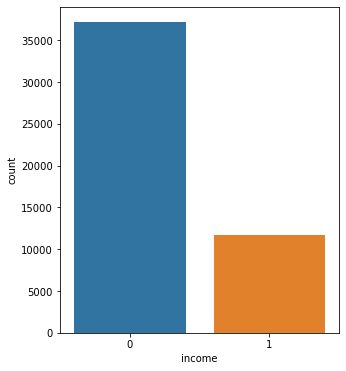

In [13]:
fig = plt.figure(figsize=(5,6))
sns.countplot(x = 'income' , data = df)

#Income level less than 50K is more than 3 times of those above 50K, indicating that the the dataset is somewhat skewed. 
#However, since there is no data on the upper limit of adult's income above 50K, it's premature to conclude that the total amount of wealth are skewed towards high income group.

<AxesSubplot:xlabel='education', ylabel='count'>

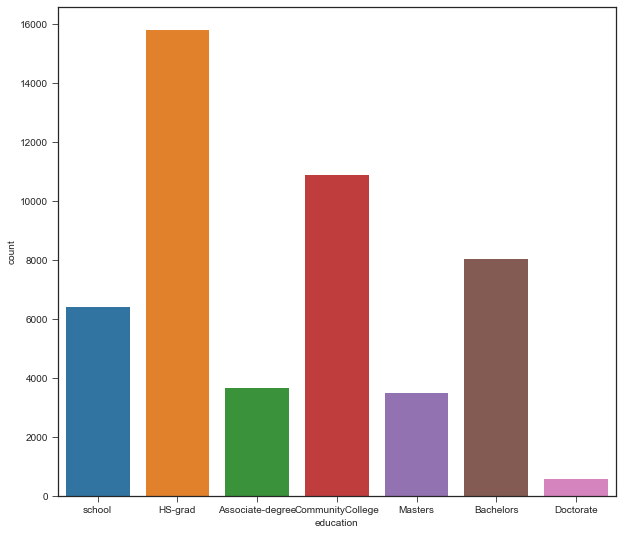

In [14]:

#Education

#income_df[['education', 'education-num']].groupby(['education'], as_index=False).mean().sort_values(by='education-num', ascending=False)

df['education'].replace(['Preschool','11th','10th','12th','1st-4th','5th-6th','7th-8th', '9th'], 'school',inplace=True)
df['education'].replace('Some-college', 'CommunityCollege',inplace=True)
df['education'].replace('Prof-school', 'Masters',inplace=True)
df['education'].replace(['Assoc-acdm','Assoc-voc'],'Associate-degree', inplace = True)
#df[['education', 'education-num']].groupby(['education'], as_index=False).mean().sort_values(by='education-num', ascending=False)

fig = plt.figure(figsize=(10,9))
plt.style.use('seaborn-ticks')
sns.countplot(x="education", data=df)


<AxesSubplot:xlabel='workclass', ylabel='count'>

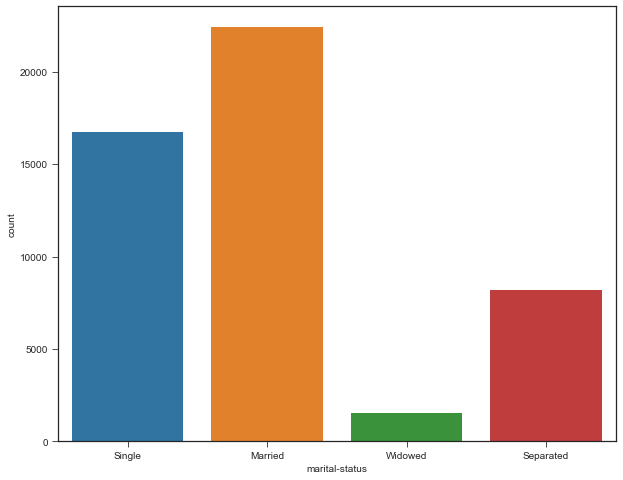

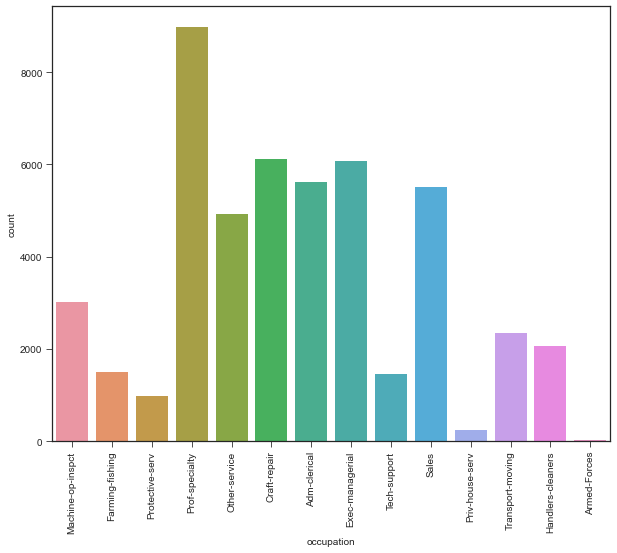

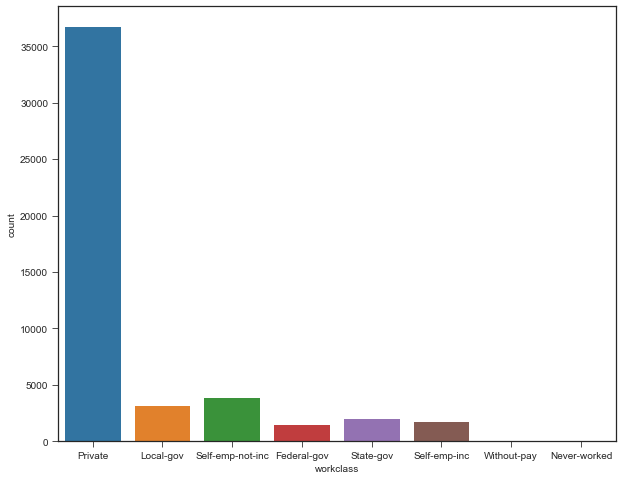

In [15]:
#Marital-status

#df2 = df['marital-status'].replace(' Never-married', 'NotMarried')
df['marital-status'].replace('Never-married', 'Single',inplace=True)
df['marital-status'].replace(['Married-AF-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-civ-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-spouse-absent'], 'Single',inplace=True)
df['marital-status'].replace(['Divorced'], 'Separated',inplace=True)

fig = plt.figure(figsize=(10,8))
plt.style.use('seaborn-ticks')
sns.countplot(x="marital-status", data=df)

#Occupation

plt.style.use('seaborn-ticks')
plt.figure(figsize=(10,8)) 
sns.countplot(x="occupation", data=df)
plt.xticks(rotation = 90)
#Workclass

plt.style.use('seaborn-ticks')
plt.figure(figsize=(10,8)) 
sns.countplot(x="workclass", data=df)

38.64358543876172
0    36
dtype: int64


37.0

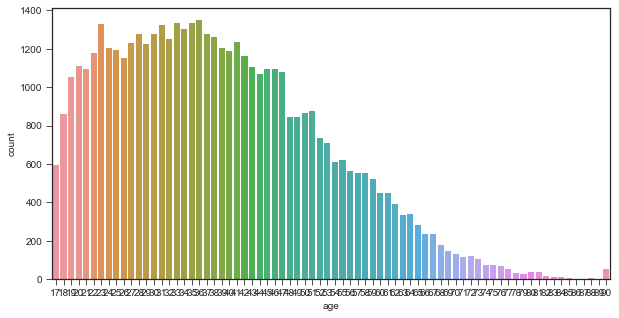

In [16]:
fig = plt.figure(figsize = (10 , 5))
sns.countplot(x= 'age',data = df)
print(df['age'].mean())
print(df['age'].mode())
df['age'].median()


In [17]:
df['age'].min()

17

In [18]:
df['age_group'] = pd.cut(df['age'], bins=[16, 25 , 60, 100] , labels = ['Youth' , 'Adults' , 'Seniors'] )

In [19]:
df.head(100)

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income,age_group
0,25,Private,226802,school,7,Single,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,0,Youth
1,38,Private,89814,HS-grad,9,Married,Farming-fishing,Husband,White,Male,0,0,50,United-States,0,Adults
2,28,Local-gov,336951,Associate-degree,12,Married,Protective-serv,Husband,White,Male,0,0,40,United-States,1,Adults
3,44,Private,160323,CommunityCollege,10,Married,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,1,Adults
4,18,Private,103497,CommunityCollege,10,Single,Prof-specialty,Own-child,White,Female,0,0,30,United-States,0,Youth
5,34,Private,198693,school,6,Single,Other-service,Not-in-family,White,Male,0,0,30,United-States,0,Adults
6,29,Private,227026,HS-grad,9,Single,Prof-specialty,Unmarried,Black,Male,0,0,40,United-States,0,Adults
7,63,Self-emp-not-inc,104626,Masters,15,Married,Prof-specialty,Husband,White,Male,3103,0,32,United-States,1,Seniors
8,24,Private,369667,CommunityCollege,10,Single,Other-service,Unmarried,White,Female,0,0,40,United-States,0,Youth
9,55,Private,104996,school,4,Married,Craft-repair,Husband,White,Male,0,0,10,United-States,0,Adults


C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


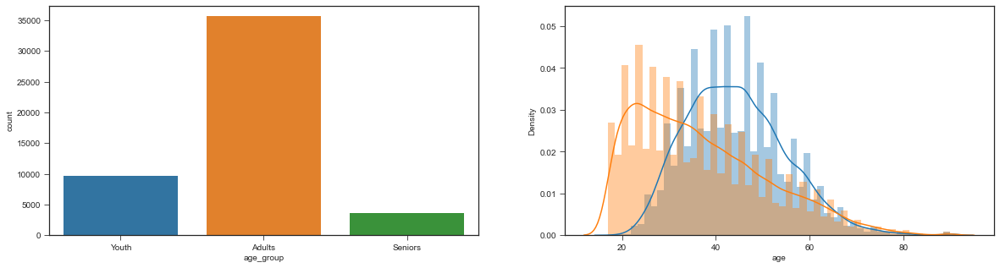

In [20]:
#age

plt.style.use('seaborn-ticks')
fig = plt.figure(figsize=(20,5)) 
plt.subplot(1, 2, 1)
sns.countplot(x="age_group", data=df)
plt.subplot(1, 2, 2)
sns.distplot(df[df['income'] == 1]['age'], kde_kws={"label": ">$50K"})
sns.distplot(df[df['income'] == 0]['age'], kde_kws={"label": "<=$50K"});

<AxesSubplot:xlabel='race', ylabel='count'>

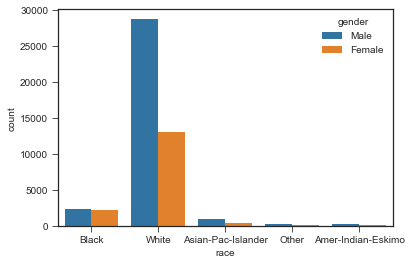

In [21]:
sns.countplot(x = 'race' , data = df , hue = 'gender')

In [22]:
print(df[['income', 'age']].groupby(['income'], as_index=False).mean().sort_values(by='age', ascending=False))

   income        age
1       1  44.275178
0       0  36.872184


C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\seaborn\distributions.py:2595: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in 

<AxesSubplot:xlabel='age-hours'>

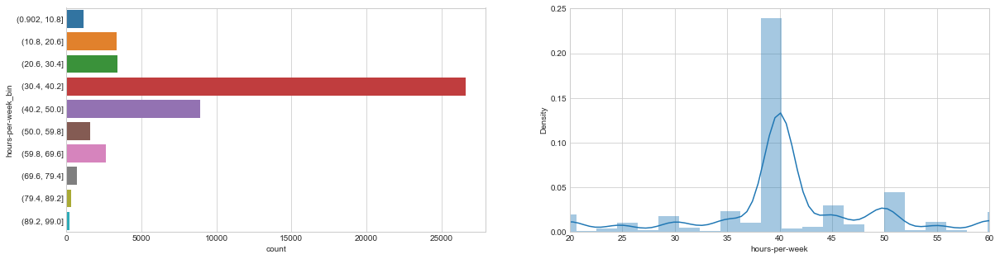

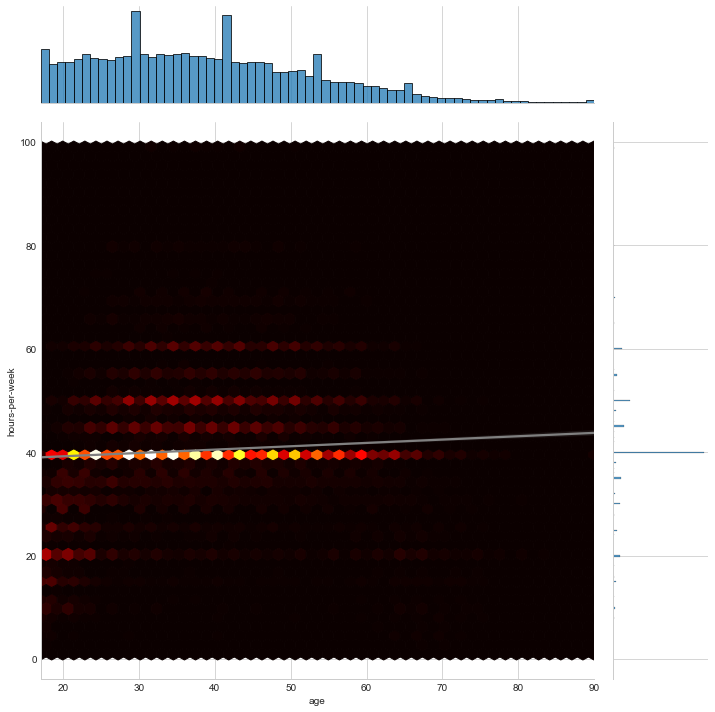

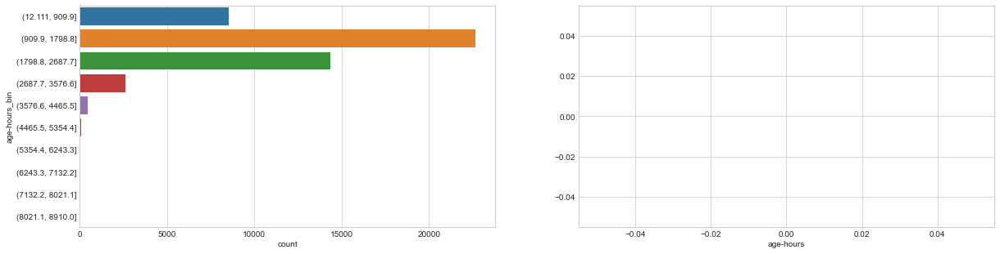

In [23]:
#Hours of Work

# Let's use the Pandas Cut function to bin the data in equally sized buckets
df['hours-per-week_bin'] = pd.cut(df['hours-per-week'], 10)
df['hours-per-week'] = df['hours-per-week']

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,5)) 
plt.subplot(1, 2, 1)
sns.countplot(y="hours-per-week_bin", data=df);
plt.subplot(1, 2, 2)
sns.distplot(df['hours-per-week']);
sns.distplot(df[df['income'] == '>50K']['hours-per-week'], kde_kws={"label": ">$50K"})
sns.distplot(df[df['income'] == '<=50K']['hours-per-week'], kde_kws={"label": "<$50K"})
plt.ylim(0, None)
plt.xlim(20, 60)


#Create a crossing feature: Age + hour of work

g = sns.jointplot(x = 'age', 
              y = 'hours-per-week',
              data = df, 
              kind = 'hex', 
              cmap= 'hot', 
              size=10)

#http://stackoverflow.com/questions/33288830/how-to-plot-regression-line-on-hexbins-with-seaborn
sns.regplot(df.age, df['hours-per-week'], ax=g.ax_joint, scatter=False, color='grey')

df.head()

# Crossing Numerical Features
df['age-hours'] = df['age']*df['hours-per-week']
df['age-hours_bin'] = pd.cut(df['age-hours'], 10)


plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,5)) 
plt.subplot(1, 2, 1)
sns.countplot(y="age-hours_bin", data=df);
plt.subplot(1, 2, 2)
sns.distplot(df[df['income'] == '>50K']['age-hours'], kde_kws={"label": ">$50K"})
sns.distplot(df[df['income'] == '<=50K']['age-hours'], kde_kws={"label": "<$50K"})


C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\seaborn\axisgrid.py:1969: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


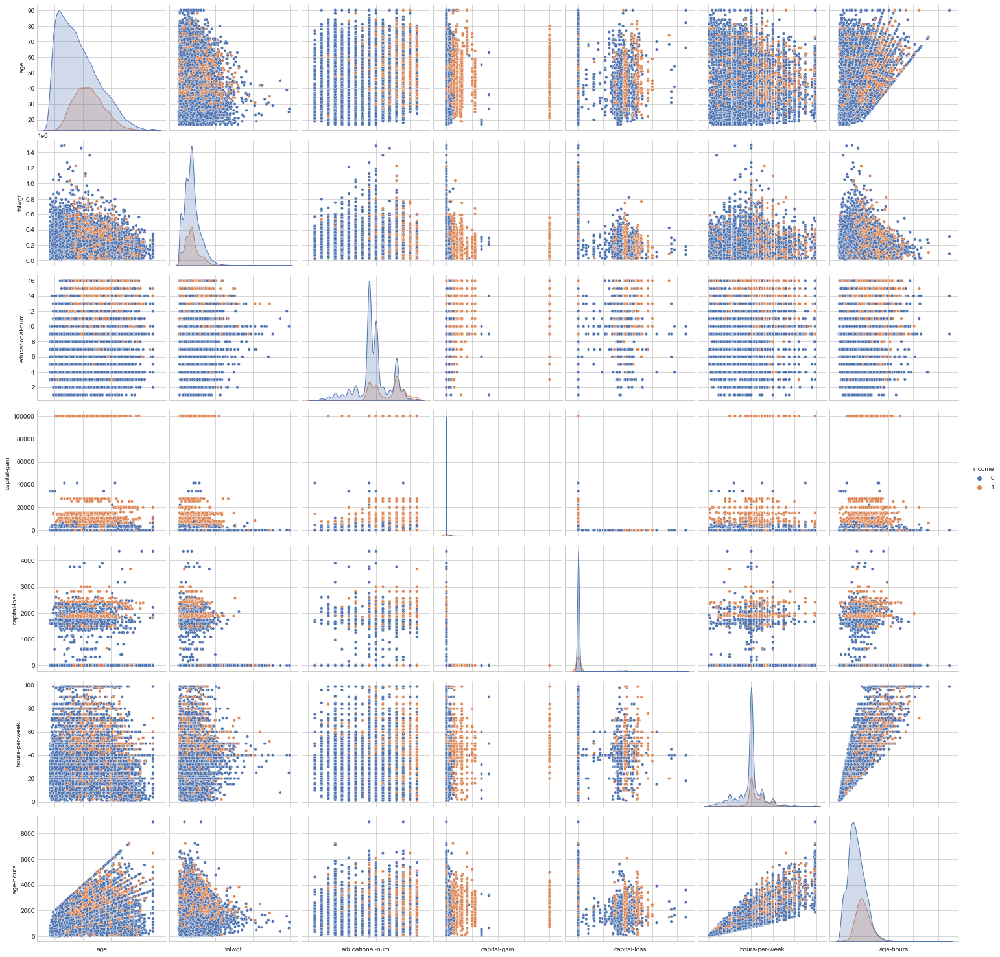

In [24]:
#EDA
#Pair Plot

#pair plots of entire dataset
pp = sns.pairplot(df, hue = 'income', palette = 'deep', 
                  size=3, diag_kind = 'kde', diag_kws=dict(shade=True), plot_kws=dict(s=20) )
pp.set(xticklabels=[])

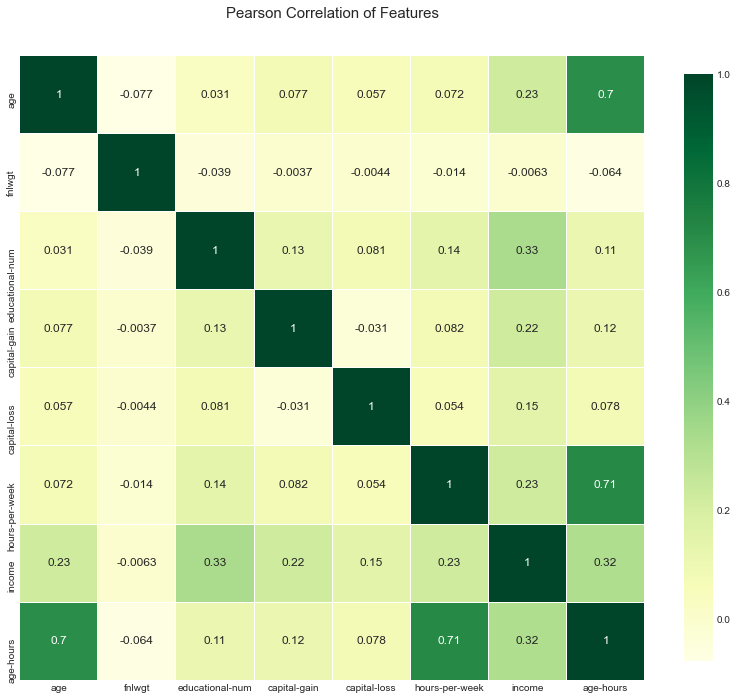

In [25]:
#Correlation Heatmap

#correlation heatmap of dataset
def correlation_heatmap(df):
    _ , ax = plt.subplots(figsize =(14, 12))
    colormap = sns.diverging_palette(220, 10, as_cmap = True)
    
    _ = sns.heatmap(
        df.corr(), 
        cmap = "YlGn",
        square=True, 
        cbar_kws={'shrink':.9 }, 
        ax=ax,
        annot=True, 
        linewidths=0.1,vmax=1.0, linecolor='white',
        annot_kws={'fontsize':12 }
    )
    
    plt.title('Pearson Correlation of Features', y=1.05, size=15)

correlation_heatmap(df)


In [26]:
del df['fnlwgt']


#Bivariate Analysis

df.tail()

import math

def plot_bivariate_bar(dataset, hue, cols=5, width=20, height=15, hspace=0.2, wspace=0.5):
    dataset = dataset.select_dtypes(include=[np.object])
    plt.style.use('seaborn-whitegrid')
    fig = plt.figure(figsize=(width,height))
    fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=wspace, hspace=hspace)
    rows = math.ceil(float(dataset.shape[1]) / cols)
    for i, column in enumerate(dataset.columns):
        ax = fig.add_subplot(rows, cols, i + 1)
        ax.set_title(column)
        if dataset.dtypes[column] == np.object:
            g = sns.countplot(y=column, hue=hue, data=dataset)
            substrings = [s.get_text()[:10] for s in g.get_yticklabels()]
            g.set(yticklabels=substrings)
            
bivariate_df = df.loc[:, ['workclass', 'education', 
           'marital-status', 'occupation', 
           'relationship', 'race', 'gender','income']]  

plot_bivariate_bar(bivariate_df, hue='income', cols=2, width=20, height=15, hspace=0.4, wspace=0.5)


#The dataset was created in 1996, a large number of jobs fall into the category of mannual labor, e.g., Handlers cleaners, craft repairers, etc. Executive managerial role and some one with a professional speciality has a high level payment.


<AxesSubplot:xlabel='occupation', ylabel='age'>

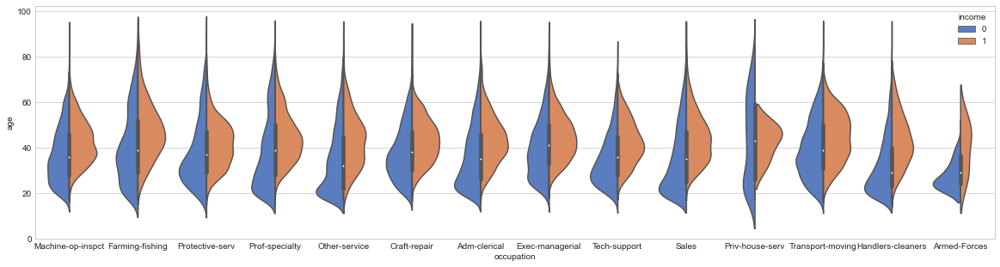

In [27]:
#Occupation vs. Income Level

from matplotlib import pyplot
a4_dims = (20, 5)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sns.violinplot(x="occupation", y="age", hue="income",
                    data=df, gridsize=100, palette="muted", split=True, saturation=0.75)
ax

#The general trend is in sync with common sense: more senior workers have higher salaries. Armed-forces don't have a high job salaries.

#Interestingly, private house sevice has the widest range of age variation, however, the payment is no higher than 50K, indicating that senority doesn't give rise to a higher payment comparing to other jobs.


<AxesSubplot:xlabel='race', ylabel='age'>

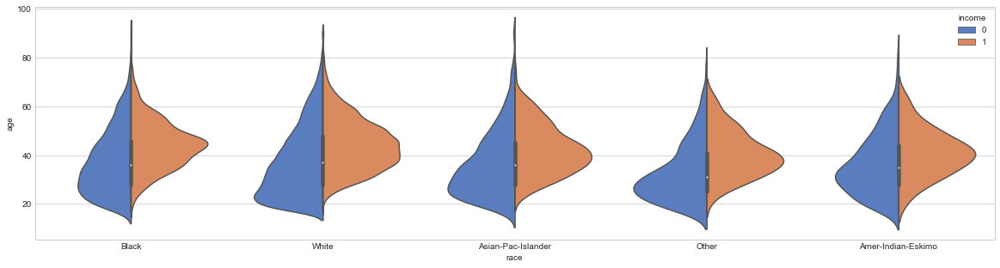

In [28]:
#Race vs. Income Level
#censusrace
from matplotlib import pyplot
a4_dims = (20, 5)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sns.violinplot(x="race", y="age", hue="income",
                    data=df, gridsize=100, palette="muted", split=True, saturation=0.75)
ax


In [29]:
df.columns

Index(['age', 'workclass', 'education', 'educational-num', 'marital-status',
       'occupation', 'relationship', 'race', 'gender', 'capital-gain',
       'capital-loss', 'hours-per-week', 'native-country', 'income',
       'age_group', 'hours-per-week_bin', 'age-hours', 'age-hours_bin'],
      dtype='object')

In [30]:
df.head()

,age,workclass,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income,age_group,hours-per-week_bin,age-hours,age-hours_bin
0,25,Private,school,7,Single,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,0,Youth,"(30.4, 40.2]",1000,"(909.9, 1798.8]"
1,38,Private,HS-grad,9,Married,Farming-fishing,Husband,White,Male,0,0,50,United-States,0,Adults,"(40.2, 50.0]",1900,"(1798.8, 2687.7]"
2,28,Local-gov,Associate-degree,12,Married,Protective-serv,Husband,White,Male,0,0,40,United-States,1,Adults,"(30.4, 40.2]",1120,"(909.9, 1798.8]"
3,44,Private,CommunityCollege,10,Married,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,1,Adults,"(30.4, 40.2]",1760,"(909.9, 1798.8]"
4,18,Private,CommunityCollege,10,Single,Prof-specialty,Own-child,White,Female,0,0,30,United-States,0,Youth,"(20.6, 30.4]",540,"(12.111, 909.9]"


In [31]:
df.drop(['hours-per-week_bin', 'age-hours_bin'],axis = 1, inplace = True)

In [32]:
df[['workclass' , 'marital-status' , 'education' ,  'occupation' ,'relationship' ,'race' ,'gender', 'age_group','native-country']].nunique()

workclass          8
marital-status     4
education          7
occupation        14
relationship       6
race               5
gender             2
age_group          3
native-country    41
dtype: int64

In [33]:
df['workclass'].replace(['Local-gov','State-gov','Federal-gov'], 'gov_employee', inplace = True)

In [34]:
#A very less number of armed-forces so we can drop them 
df['occupation'].replace("Armed-Forces" , np.nan,inplace = True)
df.dropna(inplace = True)

In [35]:
df['occupation'].replace(['Protective-serv', 'Priv-house-serv'], 'social-service', inplace = True)

In [36]:
df['education'].value_counts()

HS-grad             15581
CommunityCollege    10719
Bachelors            7814
school               6294
Associate-degree     3617
Masters              3384
Doctorate             562
Name: education, dtype: int64

In [37]:
#Dropping age and hours-per-week to reduce multicollinearity
df.drop(['age', 'hours-per-week'],axis = 1 , inplace = True)

In [38]:
df.head()

,workclass,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,native-country,income,age_group,age-hours
0,Private,school,7,Single,Machine-op-inspct,Own-child,Black,Male,0,0,United-States,0,Youth,1000
1,Private,HS-grad,9,Married,Farming-fishing,Husband,White,Male,0,0,United-States,0,Adults,1900
2,gov_employee,Associate-degree,12,Married,social-service,Husband,White,Male,0,0,United-States,1,Adults,1120
3,Private,CommunityCollege,10,Married,Machine-op-inspct,Husband,Black,Male,7688,0,United-States,1,Adults,1760
4,Private,CommunityCollege,10,Single,Prof-specialty,Own-child,White,Female,0,0,United-States,0,Youth,540


In [39]:
countries = np.array(df['native-country'].unique())
countries = np.delete(countries, [0,3])
countries

array(['Peru', 'Guatemala', 'Dominican-Republic', 'Ireland', 'Germany',
       'Philippines', 'Thailand', 'Haiti', 'El-Salvador', 'Puerto-Rico',
       'Vietnam', 'South', 'Columbia', 'Japan', 'India', 'Cambodia',
       'Poland', 'Laos', 'England', 'Cuba', 'Taiwan', 'Italy', 'Canada',
       'Portugal', 'China', 'Nicaragua', 'Honduras', 'Iran', 'Scotland',
       'Jamaica', 'Ecuador', 'Yugoslavia', 'Hungary', 'Hong', 'Greece',
       'Trinadad&Tobago', 'Outlying-US(Guam-USVI-etc)', 'France',
       'Holand-Netherlands'], dtype=object)

In [40]:
df.replace(countries , 'Others' , inplace = True)

In [41]:
x = df.drop(['income'],axis = 1)
y = df['income']

x.iloc[25900:,:]

In [42]:
x['workclass'].unique()

array(['Private', 'gov_employee', 'Self-emp-not-inc', 'Self-emp-inc',
       'Without-pay', 'Never-worked'], dtype=object)

In [43]:
array = ['workclass' , 'education' , 'marital-status', 'occupation', 'relationship','race' ,'gender' ,'native-country','age_group']
for i in array : 
    print(i + ":" , x[i].unique())

workclass: ['Private' 'gov_employee' 'Self-emp-not-inc' 'Self-emp-inc' 'Without-pay'
 'Never-worked']
education: ['school' 'HS-grad' 'Associate-degree' 'CommunityCollege' 'Masters'
 'Bachelors' 'Doctorate']
marital-status: ['Single' 'Married' 'Widowed' 'Separated']
occupation: ['Machine-op-inspct' 'Farming-fishing' 'social-service' 'Prof-specialty'
 'Other-service' 'Craft-repair' 'Adm-clerical' 'Exec-managerial'
 'Tech-support' 'Sales' 'Transport-moving' 'Handlers-cleaners']
relationship: ['Own-child' 'Husband' 'Not-in-family' 'Unmarried' 'Wife' 'Other-relative']
race: ['Black' 'White' 'Other' 'Amer-Indian-Eskimo' 'Asian-Pac-Islander']
gender: ['Male' 'Female']
native-country: ['United-States' 'Others' 'Mexico']
age_group: ['Youth', 'Adults', 'Seniors']
Categories (3, object): ['Youth' < 'Adults' < 'Seniors']


In [44]:
y.head()

0    0
1    0
2    1
3    1
4    0
Name: income, dtype: int64

In [45]:
y.value_counts()

0    36508
1    11463
Name: income, dtype: int64

In [129]:
from sklearn.model_selection import train_test_split

x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.3 , random_state = 0, stratify = y)

In [130]:
df.head(100)

,workclass,education,educational_num,occupation,relationship,race,capital_gain,capital_loss,age_hours,marital_status_Separated,marital_status_Single,marital_status_Widowed,gender_Male,native_country_Others,native_country_United_States,age_group_Adults,age_group_Seniors
0,2,4,2.197225,7,2,4,0,0,6.586172,1,0,0,1,0,1,1,0


In [131]:
x_test.head(100)

,workclass,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,native-country,age_group,age-hours
34205,Private,Masters,14,Married,Prof-specialty,Husband,White,Male,0,0,United-States,Adults,2250
46959,Private,school,8,Single,Other-service,Own-child,White,Male,0,0,United-States,Youth,324
47372,Self-emp-inc,HS-grad,9,Separated,Prof-specialty,Other-relative,White,Male,0,0,United-States,Adults,725
18947,Private,HS-grad,9,Single,Handlers-cleaners,Own-child,White,Male,0,0,United-States,Youth,860
29378,Private,Bachelors,13,Single,Other-service,Unmarried,Other,Male,0,0,United-States,Adults,1280
13408,Private,Masters,14,Married,Exec-managerial,Husband,White,Male,0,0,United-States,Adults,1500
26537,Private,school,6,Separated,Other-service,Unmarried,Black,Female,0,0,United-States,Adults,1800
3979,gov_employee,Doctorate,16,Separated,Prof-specialty,Not-in-family,White,Male,0,0,United-States,Adults,1530
36456,Private,Bachelors,13,Single,Adm-clerical,Not-in-family,White,Male,0,0,Others,Adults,1080
1245,Self-emp-inc,Bachelors,13,Married,Prof-specialty,Husband,White,Male,0,0,United-States,Seniors,2130


In [47]:
x_train.shape , y_train.shape

((33579, 13), (33579,))

In [48]:
y_train.value_counts()

0    25555
1     8024
Name: income, dtype: int64

In [49]:
y_test.value_counts()

0    10953
1     3439
Name: income, dtype: int64

In [132]:
from sklearn.preprocessing import LabelEncoder

lc = LabelEncoder()
var = ['workclass' , 'education' , 'race','occupation', 'relationship']

for data in var : 
    x_train[data] = lc.fit_transform(x_train[data])
    x_test[data] = lc.fit_transform(x_test[data])

C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [133]:
pd.options.display.max_columns = None
x_train = pd.get_dummies(x_train, drop_first = True)
x_test = pd.get_dummies(x_test, drop_first = True)

In [52]:
x['gender'].value_counts()

Male      32027
Female    15944
Name: gender, dtype: int64

In [53]:
x_test.head(100)

,workclass,education,educational-num,occupation,relationship,race,capital-gain,capital-loss,age-hours,marital-status_Separated,marital-status_Single,marital-status_Widowed,gender_Male,native-country_Others,native-country_United-States,age_group_Adults,age_group_Seniors
34205,1,5,14,7,0,4,0,0,2250,0,0,0,1,0,1,1,0
46959,1,6,8,6,3,4,0,0,324,0,1,0,1,0,1,0,0
47372,2,4,9,7,2,4,0,0,725,1,0,0,1,0,1,1,0
18947,1,4,9,4,3,4,0,0,860,0,1,0,1,0,1,0,0
29378,1,1,13,6,4,3,0,0,1280,0,1,0,1,0,1,1,0
13408,1,5,14,2,0,4,0,0,1500,0,0,0,1,0,1,1,0
26537,1,6,6,6,4,2,0,0,1800,1,0,0,0,0,1,1,0
3979,5,3,16,7,1,4,0,0,1530,1,0,0,1,0,1,1,0
36456,1,1,13,0,1,4,0,0,1080,0,1,0,1,1,0,1,0
1245,2,1,13,7,0,4,0,0,2130,0,0,0,1,0,1,0,1


In [54]:
x_test.head(100)

,workclass,education,educational-num,occupation,relationship,race,capital-gain,capital-loss,age-hours,marital-status_Separated,marital-status_Single,marital-status_Widowed,gender_Male,native-country_Others,native-country_United-States,age_group_Adults,age_group_Seniors
34205,1,5,14,7,0,4,0,0,2250,0,0,0,1,0,1,1,0
46959,1,6,8,6,3,4,0,0,324,0,1,0,1,0,1,0,0
47372,2,4,9,7,2,4,0,0,725,1,0,0,1,0,1,1,0
18947,1,4,9,4,3,4,0,0,860,0,1,0,1,0,1,0,0
29378,1,1,13,6,4,3,0,0,1280,0,1,0,1,0,1,1,0
13408,1,5,14,2,0,4,0,0,1500,0,0,0,1,0,1,1,0
26537,1,6,6,6,4,2,0,0,1800,1,0,0,0,0,1,1,0
3979,5,3,16,7,1,4,0,0,1530,1,0,0,1,0,1,1,0
36456,1,1,13,0,1,4,0,0,1080,0,1,0,1,1,0,1,0
1245,2,1,13,7,0,4,0,0,2130,0,0,0,1,0,1,0,1


In [134]:
x_train = x_train.rename(columns = {'educational-num' : 'educational_num' , 'capital-gain' : 'capital_gain', 'capital-loss' : 'capital_loss', 'age-hours' : 'age_hours', 'marital-status_Married':'marital_status_Married', 'marital-status_Separated':'marital_status_Separated', 'marital-status_Single':'marital_status_Single', 'marital-status_Widowed':'marital_status_Widowed', 'native-country_Mexico':'native_country_Mexico', 'native-country_Others':'native_country_Others', 'native-country_United-States':'native_country_United_States'})
x_test = x_test.rename(columns = {'educational-num' : 'educational_num' , 'capital-gain' : 'capital_gain', 'capital-loss' : 'capital_loss', 'age-hours' : 'age_hours', 'marital-status_Married':'marital_status_Married','marital-status_Separated':'marital_status_Separated', 'marital-status_Single':'marital_status_Single', 'marital-status_Widowed':'marital_status_Widowed', 'native-country_Mexico':'native_country_Mexico', 'native-country_Others':'native_country_Others', 'native-country_United-States':'native_country_United_States'})

In [77]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
x_train = pd.DataFrame(sc.fit_transform(x_train), columns = x_train.columns)
x_test = pd.DataFrame(sc.transform(x_test), columns = x_train.columns)

In [57]:
x_train.head(10)

,workclass,education,educational_num,occupation,relationship,race,capital_gain,capital_loss,age_hours,marital_status_Separated,marital_status_Single,marital_status_Widowed,gender_Male,native_country_Others,native_country_United_States,age_group_Adults,age_group_Seniors
0,-0.519307,-0.594047,-0.022865,-1.463592,0.975746,-0.811984,-0.143286,-0.218478,-1.564291,-0.450494,1.389466,-0.178156,-1.423839,-0.265749,0.306058,-1.631145,-0.284538
1,-0.519307,0.500857,-0.413201,0.688938,-0.900088,-2.010842,-0.143286,-0.218478,-0.496867,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
2,-0.519307,-1.141499,1.148142,0.688938,-0.274810,0.386873,-0.143286,-0.218478,0.997527,-0.450494,-0.719701,5.613047,-1.423839,-0.265749,0.306058,0.613066,-0.284538
3,2.330356,-1.688950,0.367470,-1.156087,-0.274810,0.386873,-0.143286,-0.218478,0.036845,-0.450494,1.389466,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
4,-0.519307,-0.594047,-0.022865,-0.848583,-0.900088,0.386873,-0.143286,-0.218478,-0.550238,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
5,-0.519307,-1.141499,1.148142,-1.463592,-0.274810,-2.010842,-0.143286,-0.218478,-0.710352,-0.450494,1.389466,-0.178156,-1.423839,-0.265749,0.306058,0.613066,-0.284538
6,-0.519307,0.500857,-0.413201,-0.848583,-0.900088,0.386873,-0.143286,-0.218478,1.971552,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,-1.631145,3.514469
7,-0.519307,1.595760,-0.803536,0.381434,-0.900088,-2.010842,-0.143286,-0.218478,-0.230011,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
8,-0.519307,-0.594047,-0.022865,1.611451,-0.274810,0.386873,-0.143286,-0.218478,0.890784,2.219786,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
9,-0.519307,1.595760,-2.364879,0.073930,-0.900088,0.386873,-0.143286,-0.218478,0.517186,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538


In [58]:
!pip install imblearn

In [137]:
import imblearn
from imblearn.combine import SMOTETomek
smote = SMOTETomek(0.8)
xtrain , ytrain = smote.fit_resample(x_train , y_train)
ytrain.value_counts()

C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\imblearn\utils\_validation.py:591: FutureWarning: Pass sampling_strategy=0.8 as keyword args. From version 0.9 passing these as positional arguments will result in an error
  FutureWarning,


0    24862
1    19751
Name: income, dtype: int64

In [138]:
#Building Machine Learning Models

from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV


#importing all the required ML packages
from sklearn.linear_model import LogisticRegression #logistic regression
from sklearn import svm #support vector Machine
from sklearn.ensemble import RandomForestClassifier #Random Forest
from sklearn.neighbors import KNeighborsClassifier #KNN
from sklearn.naive_bayes import GaussianNB #Naive bayes
from sklearn.tree import DecisionTreeClassifier #Decision Tree
from sklearn import metrics #accuracy measure
from sklearn.metrics import confusion_matrix #for confusion matrix


In [61]:

#Gaussian Naive Bayes

# Gaussian Naive Bayes
gaussian = GaussianNB()
gaussian.fit(xtrain, ytrain)
from sklearn.model_selection import cross_val_score
score_ppn=cross_val_score(gaussian, xtrain,ytrain, cv=5)
score_ppn.mean()
# y_pred = gaussian.predict(X_test)
#score_gaussian = gaussian.score(X_test,y_test)
#print('The accuracy of Gaussian Naive Bayes is', score_gaussian)

0.7914893826266004

In [62]:

#Linear Support Vector Machine

# Support Vector Classifier (SVM/SVC)
from sklearn.svm import SVC
svc = SVC(gamma=0.22)
#svc.fit(X_train, y_train)
from sklearn.model_selection import cross_val_score
score_ppn=cross_val_score(svc, xtrain,ytrain, cv=5)
score_ppn.mean()
#y_pred = logreg.predict(X_test)
# score_svc = svc.score(X_test,y_test)
# print('The accuracy of SVC is', score_svc)


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\IPython\core\interactiveshell.py", line 3343, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-62-50fe2158ac87>", line 8, in <module>
    score_ppn=cross_val_score(svc, xtrain,ytrain, cv=5)
  File "C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\sklearn\model_selection\_validation.py", line 450, in cross_val_score
    error_score=error_score)
  File "C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\sklearn\utils\validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\sklearn\model_selection\_validation.py", line 256, in cross_validate
    for train, test in cv.split(X, y, groups))
  File "C:\Users\Rahie\anaconda3\envs\ml\lib\site-packages\joblib

TypeError: object of type 'NoneType' has no len()

In [ ]:

#Radical Support Vector Machine

svc_radical =svm.SVC(kernel='rbf',C=1,gamma=0.22)
from sklearn.model_selection import cross_val_score
score_ppn=cross_val_score(svc_radical, xtrain,ytrain, cv=5)
score_ppn.mean()
# svc_radical.fit(X_train,y_train.values.ravel())
# score_svc_radical = svc_radical.score(X_test,y_test)
# print('The accuracy of Radical SVC Model is', score_svc_radical)

In [ ]:
#Logistic Regression

# Logistic Regression
logreg = LogisticRegression()
from sklearn.model_selection import cross_val_score
score_ppn=cross_val_score(logreg, xtrain,ytrain, cv=5)
score_ppn.mean()
#logreg.fit(X_train, y_train)
#y_pred = logreg.predict(X_test)
#score_logreg = logreg.score(X_test,y_test)
#print('The accuracy of the Logistic Regression is', score_logreg)

In [140]:

#Random Forest

# Random Forest Classifier
randomforest = RandomForestClassifier()
from sklearn.model_selection import cross_val_score
# score_ppn=cross_val_score(randomforest, xtrain,ytrain, cv=5)
# score_ppn.mean()
model = randomforest.fit(xtrain, ytrain)
y_pred = model.predict(x_test)
print(accuracy_score(y_pred , y_test))
#print('The accuracy of the Random Forest Model is', score_randomforest)
#print(pd.Series(randomforest.feature_importances_, index = xtrain.columns).nlargest(5))

0.8368538076709283
The accuracy of the Random Forest Model is 0.8362979433018344


In [ ]:
#K-Nearest Neighbors

# K-Nearest Neighbors
knn = KNeighborsClassifier()
from sklearn.model_selection import cross_val_score
score_ppn=cross_val_score(knn, xtrain,ytrain, cv=5)
score_ppn.mean()
# knn.fit(X_train, y_train)
# #y_pred = knn.predict(X_test)
# score_knn = knn.score(X_test,y_test)
# print('The accuracy of the KNN Model is',score_knn)




In [ ]:
#GridSearch

model = RandomForestClassifier()

parameters = {'n_estimators': [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)], 
              'max_features': ['log2', 'sqrt','auto'], 
              #The number of features to consider when looking for the best split
              'max_depth': [int(x) for x in np.linspace(5, 30, num = 6)], 
              'min_samples_split': [2, 5, 10, 15, 100],
              'min_samples_leaf' : [1, 2, 5, 10]
             }
grid_obj = RandomizedSearchCV(model, parameters, scoring="neg_log_loss",cv = 5)
grid_obj = grid_obj.fit(xtrain,ytrain)
model_params = grid_obj.best_params_
model_params

In [ ]:
from sklearn.metrics import classification_report

In [ ]:
pred = pd.DataFrame(grid_obj.predict(x_test))

In [ ]:
print(classification_report(y_test , pred))

In [ ]:
print(classification_report(pred , y_test))

In [ ]:
print(classification_report(pred , y_test))

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(pred , y_test)

In [2]:
import pickle

In [141]:
filename = 'random.pkl'
pickle.dump(model, open(filename, 'wb'))

In [64]:
x_test

,workclass,education,educational_num,occupation,relationship,race,capital_gain,capital_loss,age_hours,marital_status_Separated,marital_status_Single,marital_status_Widowed,gender_Male,native_country_Others,native_country_United_States,age_group_Adults,age_group_Seniors
0,-0.519307,1.048308,1.538477,0.688938,-0.900088,0.386873,-0.143286,-0.218478,0.904127,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
1,-0.519307,1.595760,-0.803536,0.381434,0.975746,0.386873,-0.143286,-0.218478,-1.665697,-0.450494,1.389466,-0.178156,0.702327,-0.265749,0.306058,-1.631145,-0.284538
2,0.193109,0.500857,-0.413201,0.688938,0.350468,0.386873,-0.143286,-0.218478,-1.130650,2.219786,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
3,-0.519307,0.500857,-0.413201,-0.233575,0.975746,0.386873,-0.143286,-0.218478,-0.950522,-0.450494,1.389466,-0.178156,0.702327,-0.265749,0.306058,-1.631145,-0.284538
4,-0.519307,-1.141499,1.148142,0.381434,1.601024,-0.811984,-0.143286,-0.218478,-0.390125,-0.450494,1.389466,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
5,-0.519307,1.048308,1.538477,-0.848583,-0.900088,0.386873,-0.143286,-0.218478,-0.096583,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
6,-0.519307,1.595760,-1.584208,0.381434,1.601024,-2.010842,-0.143286,-0.218478,0.303701,2.219786,-0.719701,-0.178156,-1.423839,-0.265749,0.306058,0.613066,-0.284538
7,2.330356,-0.046595,2.319148,0.688938,-0.274810,0.386873,-0.143286,-0.218478,-0.056555,2.219786,-0.719701,-0.178156,0.702327,-0.265749,0.306058,0.613066,-0.284538
8,-0.519307,-1.141499,1.148142,-1.463592,-0.274810,0.386873,-0.143286,-0.218478,-0.656981,-0.450494,1.389466,-0.178156,0.702327,3.762954,-3.267352,0.613066,-0.284538
9,0.193109,-1.141499,1.148142,0.688938,-0.900088,0.386873,-0.143286,-0.218478,0.744014,-0.450494,-0.719701,-0.178156,0.702327,-0.265749,0.306058,-1.631145,3.514469


In [148]:
filename = 'random.pkl'
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.predict(x_test)
result[0]

1

In [154]:
!pip freeze > requirements1.txt

In [149]:
#[[2,4,9,7,2,4,0,0,725,1,0,0,1,0,1,1,0]]
#[[1,5,14,7,0,4,0,0,2250,0,0,0,1,0,1,1,0]]
workclass = 1
education = 5
educational_num = 14
occupation = 7
relationship = 0
race = 4
capital_gain = 0
capital_loss = 0
age_hours = 2250
marital_status_Separated = 0
marital_status_Single = 0
marital_status_Widowed = 0
gender_Male = 1
native_country_Others = 0
native_country_United_States =1
age_group_Adults =1
age_group_Seniors =0

In [150]:
list = [[workclass, education,educational_num,occupation,relationship ,race ,capital_gain,capital_loss,age_hours , marital_status_Separated,marital_status_Single,marital_status_Widowed,gender_Male,native_country_Others,native_country_United_States,age_group_Adults,age_group_Seniors]]
df = pd.DataFrame(list , columns=['workclass', 'education','educational_num','occupation','relationship' ,'race' ,'capital_gain','capital_loss','age_hours' , 'marital_status_Separated','marital_status_Single','marital_status_Widowed','gender_Male','native_country_Others','native_country_United_States','age_group_Adults','age_group_Seniors'])
df

,workclass,education,educational_num,occupation,relationship,race,capital_gain,capital_loss,age_hours,marital_status_Separated,marital_status_Single,marital_status_Widowed,gender_Male,native_country_Others,native_country_United_States,age_group_Adults,age_group_Seniors
0,1,5,14,7,0,4,0,0,2250,0,0,0,1,0,1,1,0


In [153]:
prediction = loaded_model.predict([[1,5,14,7,0,4,0,0,2250,0,0,0,1,0,1,1,0]])
prediction

array([1], dtype=int64)

In [1]:
!pip freeze > requirements.txt

In [3]:
!pip install requests

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spacy 2.1.3 requires cymem<2.1.0,>=2.0.2, which is not installed.
spacy 2.1.3 requires murmurhash<1.1.0,>=0.28.0, which is not installed.
spacy 2.1.3 requires preshed<2.1.0,>=2.0.1, which is not installed.
spacy 2.1.3 requires srsly<1.1.0,>=0.0.5, which is not installed.
spacy 2.1.3 requires wasabi<1.1.0,>=0.2.0, which is not installed.
bert-extractive-summarizer 0.2.2 requires neuralcoref, which is not installed.
bert-extractive-summarizer 0.2.2 requires transformers, which is not installed.
spacy 2.1.3 requires jsonschema<3.0.0,>=2.6.0, but you have jsonschema 3.2.0 which is incompatible.
